# Capstone 3 - Data Wrangling:

In this notebook I set out to do some cleansing of medical transcripts. The overal intent with Capstone three is to explore Transfer Learning with several different pretrained models for summarization tasks. The idea situation would be to have access to the MIMIC-III dataset to practice fine-tuning a model with more data. While I wait for my credential approval I will be proceeding forward using a dataset with ~ 5000 transcribed medical documents from various medical disciplines.

I have identified an ideal model candidate upon which to start my efforts: the ClinicalBioBertsumext model which is the extractive summarization version of the BERT transformer model that is ALREADY fine-tuned using the MIMIC dataset. For reference I am proceeding with data cleansing and standardization of the data in a process similar to the one described [here](https://web.stanford.edu/class/cs224n/reports/final_reports/report005.pdf). 

In [1]:
from google.colab import drive
drive.mount('/content/gdrive')

Mounted at /content/gdrive


In [2]:
!pip install --quiet scispacy
!pip install --quiet https://s3-us-west-2.amazonaws.com/ai2-s2-scispacy/releases/v0.5.0/en_core_sci_md-0.5.0.tar.gz
#en-core-sci-md

     |████████████████████████████████| 44 kB 2.4 MB/s 
     |████████████████████████████████| 13.5 MB 34.6 MB/s 
     |████████████████████████████████| 71 kB 8.3 MB/s 
     |████████████████████████████████| 6.0 MB 65.7 MB/s 
     |████████████████████████████████| 188 kB 77.0 MB/s 
     |████████████████████████████████| 181 kB 73.6 MB/s 
     |████████████████████████████████| 10.1 MB 46.5 MB/s 
     |████████████████████████████████| 42 kB 1.4 MB/s 
     |████████████████████████████████| 451 kB 64.4 MB/s 
     |████████████████████████████████| 653 kB 46.7 MB/s 
     |████████████████████████████████| 120.2 MB 59 kB/s 


In [3]:
import pandas as pd
import numpy as np
import pathlib
import re
import string
import spacy

import nltk
nltk.download('stopwords')
nltk.download('wordnet')
from nltk.corpus import stopwords
stop_words = stopwords.words('english')

from collections import Counter
from tqdm.notebook import tqdm

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.
[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data]   Unzipping corpora/wordnet.zip.


In [4]:
nlp = spacy.load("en_core_sci_md")

In [5]:
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline

In [6]:
cwd = pathlib.Path.cwd()
datapath = cwd/'gdrive/MyDrive/Capstone_three/data/mtsamples/'

In [65]:
df = pd.read_csv(datapath/'mtsamples.csv',index_col=[0])

## First look at the data

In [66]:
df.head()

,description,medical_specialty,sample_name,transcription,keywords
0,A 23-year-old white female presents with comp...,Allergy / Immunology,Allergic Rhinitis,"SUBJECTIVE:, This 23-year-old white female pr...","allergy / immunology, allergic rhinitis, aller..."
1,Consult for laparoscopic gastric bypass.,Bariatrics,Laparoscopic Gastric Bypass Consult - 2,"PAST MEDICAL HISTORY:, He has difficulty climb...","bariatrics, laparoscopic gastric bypass, weigh..."
2,Consult for laparoscopic gastric bypass.,Bariatrics,Laparoscopic Gastric Bypass Consult - 1,"HISTORY OF PRESENT ILLNESS: , I have seen ABC ...","bariatrics, laparoscopic gastric bypass, heart..."
3,2-D M-Mode. Doppler.,Cardiovascular / Pulmonary,2-D Echocardiogram - 1,"2-D M-MODE: , ,1. Left atrial enlargement wit...","cardiovascular / pulmonary, 2-d m-mode, dopple..."
4,2-D Echocardiogram,Cardiovascular / Pulmonary,2-D Echocardiogram - 2,1. The left ventricular cavity size and wall ...,"cardiovascular / pulmonary, 2-d, doppler, echo..."


In [67]:
df.isna().sum()

description             0
medical_specialty       0
sample_name             0
transcription          33
keywords             1068
dtype: int64

First look at the data suggests there is going to be a lot of inconsistencies in the information. Additionally, considering the size of the data set there is a considerable amount of information missing from the keywords column. There are several records in the transcription column for which there are no records so we shall drop those missing values right off the bat. Furthermore, considering that there is so much data missing keyword information we shall drop that entire column, and the sample_name column as well since it is an identifier from the website hosting these transcribed records.

In [68]:
df.dropna(subset=['transcription'],inplace=True)

In [69]:
df.drop(columns=['sample_name','keywords'], inplace=True)

In [70]:
df.iloc[1002]

description           Iron deficiency anemia.  Diverticulosis in th...
medical_specialty                                              Surgery
transcription        PREOPERATIVE DIAGNOSIS:,  Iron deficiency anem...
Name: 1018, dtype: object

## Coming up with a splitting criteria

From the aforementioned paper, the data that the model was fine-tuned looked like this:

Example Input.

**X:**
INDICATION: Right lower quadrant pain and recent pneumonia, evaluate for pneumonia.
FINDINGS: PA and lateral views of the chest.
Previously seen pneumonia in the right lower and mid lung are no longer apparent.
The lungs are clear. The cardiac, mediastinal, and hilar contours are normal.
There is no pleural effusion or pneumothorax.
There is no pulmonary vascular congestion.

**Y:**
IMPRESSION: Resolution of previously seen pneumonia. No new consolidations.


The goal for this project will be to get data into a similar fashion with similar restrictions.
1. Data will be split into input and target values using a heuristic method.
2. The data will only be kept as long as the input in longer than the target.

In [71]:
df.iloc[1002].transcription

'PREOPERATIVE DIAGNOSIS:,  Iron deficiency anemia.,POSTOPERATIVE DIAGNOSIS:,  Diverticulosis.,PROCEDURE:,  Colonoscopy.,MEDICATIONS: , MAC.,PROCEDURE: , The Olympus pediatric variable colonoscope was introduced into the rectum and advanced carefully through the colon to the cecum identified by the ileocecal valve and the appendiceal orifice.  Preparation was good, although there was some residual material in the cecum that was difficult to clear completely.  The mucosa was normal throughout the colon.  No polyps or other lesions were identified, and no blood was noted.  Some diverticula were seen of the sigmoid colon with no luminal narrowing or evidence of inflammation.  A retroflex view of the anorectal junction showed no hemorrhoids.  The patient tolerated the procedure well and was sent to the recovery room.,FINAL DIAGNOSES:,1.  Diverticulosis in the sigmoid.,2.  Otherwise normal colonoscopy to the cecum.,RECOMMENDATIONS:,1.  Follow up with Dr. X as needed.,2.  Screening colonoscop

## Observation

From the above transcription sample we can se that there are several consitent patterns that we can try to leverage to our benefit.

The first pattern is that there appears to be '.,' that separates distinct sections of the data.
The second patterns builds upon the first and comes from the recognition that the text for an entire section comes either before the end of the document or ',.[SOME UPPERCASE TEXT]:'.

We shall explore the ability to preprocess the text and extract pertinent information from each text using these two observations.

### Observation 1:

A simple split on the observed pattern of ".," would cause a great deal of information from certain categories to be missed.

In [72]:
df[~df.transcription.str.contains('.,')]

,description,medical_specialty,transcription
166,Normal Circumcision,Urology,The patient tolerated the procedure well and w...
1035,Normal Circumcision,Surgery,The patient tolerated the procedure well and w...
1342,Ophthalmology followup visit note.,SOAP / Chart / Progress Notes,A fluorescein angiogram was ordered at today's...
2411,Ophthalmology followup visit note.,Ophthalmology,A fluorescein angiogram was ordered at today's...


In [73]:
df.transcription.duplicated().sum()

2609

damn

## Naive preprocessing

Below I attempt a first pattern for splitting the data to ensure that all of the data is captured under each category in each of the transcriptions.

In [75]:
def col_pp(frame, column):
    frame['pp'] = frame[column].apply(lambda x: re.sub(r'\s\s',' ',x)) #catch double spaces
    frame['pp'] = frame['pp'].apply(lambda x: re.sub(r':\s,',':,',x))
    frame['pp'] = frame['pp'].apply(lambda x: re.sub(r'\s,','',x))
    frame['pp'] = frame['pp'].apply(lambda x: re.sub(r',[0-9]+\.\s',' ',x))
    frame['pp'] = frame['pp'].apply(lambda x: re.sub(r'\.,[0-9]\.','',x))
    frame['pp'] = frame['pp'].apply(lambda x: re.sub(r':,',' ',x))
    frame['pp'] = frame['pp'].apply(lambda x: re.sub(r'a\.m\.','am',x))
    frame['pp'] = frame['pp'].apply(lambda x: re.sub(r'p\.m\.','pm',x))
    frame['pp'] = frame['pp'].apply(lambda x: x.rstrip())
    frame['pp'] = frame['pp'].apply(lambda x: x.split('.,'))
    frame['pp'] = frame['pp'].apply(lambda x: [re.sub(r'[^a-zA-Z0-9\s\.]','',item) for item in x if item != ''])
    

In [76]:
col_pp(df, 'transcription')

In [77]:
df.iloc[3456].pp

['PREOPERATIVE DIAGNOSIS  Abdominal mass',
 'POSTOPERATIVE DIAGNOSIS  Abdominal mass',
 'PROCEDURE  Paracentesis',
 'DESCRIPTION OF PROCEDURE This 64yearold female has stage II endometrial carcinoma which had been resected before and treated with chemotherapy and radiation. At the present time the patient is under radiation treatment. Two weeks ago or so she developed a large abdominal mass which was cystic in nature and the radiologist inserted a pigtail catheter in the emergency room. We proceeded to admit the patient and drained a significant amount of clear fluid in the subsequent days. The cytology of the fluid was negative and the culture was also negative. Eventually the patient was sent home with the pigtail shut off and the patient a week later underwent a repeat CAT scan of the abdomen and pelvis. The CAT scan showed accumulation of the fluid and the mass almost achieving 80 of the previous size. Therefore I called the patient home and she came to the emergency department whe

In [78]:
df.iloc[2334].pp

['PREOPERATIVE DIAGNOSES Herniated nucleus pulposus C2C3. Spinal stenosis C3C4',
 'POSTOPERATIVE DIAGNOSES Herniated nucleus pulposus C2C3. Spinal stenosis C3C4',
 'PROCEDURES Anterior cervical discectomy C3C4 C2C3. Anterior cervical fusion C2C3 C3C4. Removal of old instrumentation C4C5. Fusion C3C4 and C2C3 with instrumentation using ABC plates',
 'PROCEDURE IN DETAIL  The patient was placed in the supine position. The neck was prepped and draped in the usual fashion for anterior cervical discectomy. A high incision was made to allow access to C2C3. Skin and subcutaneous tissue and the platysma were divided sharply exposing the carotid sheath which was retracted laterally and the trachea and esophagus were retracted medially. This exposed the vertebral bodies of C2C3 and C4C5 which was bridged by a plate. We placed in selfretaining retractors. With the tooth beneath the blades the longus colli muscles were dissected away from the vertebral bodies of C2 C3 C4 and C5. After having done 

In [79]:
df.reset_index(inplace=True, drop=True)

In [80]:
check_10pct = np.random.choice(df.index.tolist(),int(df.shape[0]/10), replace=False)

In [81]:
for item in check_10pct:
    print(item,df.iloc[item].pp)

4057 ['CHIEF COMPLAINT  Left wrist pain', 'HISTORY OF PRESENT PROBLEM']
2830 ['CC  Rapidly progressive amnesia', 'HX This 63 yo RHM presented with a 1 year history of progressive anterograde amnesia. On presentation he could not remember anything from one minute to the next. He also had some retrograde memory loss in that he could not remember the names of his grandchildren but had generally preserved intellect language personality and calculating ability. He underwent extensive evaluation at the Mayo Clinic and an MRI there revealed increased signal on T2 weighted images in the mesiotemporal lobes bilaterally. There was no mass affect. The areas mildly enhanced with gadolinium', 'PMH  1 CAD MI x 2 1978 and 1979. 2 PVD sp aortic endarterectomy 31991. 3HTN. 4Bilateral inguinal hernia repair', 'FHXSHX  Mother died of a stroke at age 58. Father had CAD and HTN. The patient quit smoking in 1991 but was a heavy smoker 23ppd for many years. He had been a feed salesman all of his adult life',

A slow scroll through the above list indicates that while the method works fairly well, it doesn't capture the full pattern in all cases. See below

In [82]:
df.iloc[1470].pp

['HISTORY  A is here for a follow up appointment at our Pediatric Rheumatology Clinic as well as the CCS Clinic. A is a 17yearold male with oligoarticular arthritis of his right knee. He had a joint injection back in 032007 and since then he has been doing relatively well. He is taking Indocin only as needed even though he said he has pain regularly and he said that his knee has not changed since the beginning but he said he only takes the medicine when he has pain which is not every day but almost every day. He denies any swelling more than what it was before and he denies any other joints are affected at this moment. Denies any fevers or any rashes',
 'PHYSICAL EXAMINATION  On physical examination his temperature is 98.6 weight is 104.6 kg which is 4.4 kg less than before 10870 is his blood pressure weight is 91.0 kg and his pulse is 80. He is alert active and oriented in no distress. He has no facial rashes no lymphadenopathy no alopecia. Funduscopic examination is within normal lim

In [83]:
df.iloc[109].pp

['1. Pelvic tumor. Cystocele. Rectocele',
 'POSTOPERATIVE DIAGNOSES Degenerated joint. Uterine fibroid. Cystocele. Rectocele',
 'PROCEDURE PERFORMED Total abdominal hysterectomy. Bilateral salpingooophorectomy. Repair of bladder laceration. Appendectomy. MarshallMarchettiKrantz cystourethropexy. Posterior colpoperineoplasty',
 'GROSS FINDINGS The patient had a history of a rapidly growing mass on the abdomen extending from the pelvis over the past two to three months. She had a recent DC and laparoscopy and enlarged mass was noted and could not be determined if it was from the ovary or the uterus. Curettings were negative for malignancy. The patient did have a large cystocele and rectocele and a collapsed anterior and posterior vaginal wall',
 'Upon laparotomy there was a giant uterine tumor extending from the pelvis up to the above the umbilicus compatible with approximately four to fivemonth pregnancy. The ovaries appeared to be within normal limits. There was marked adherence betwee

In [84]:
df['len_desc'] = df.description.apply(lambda x: len(x.split()))

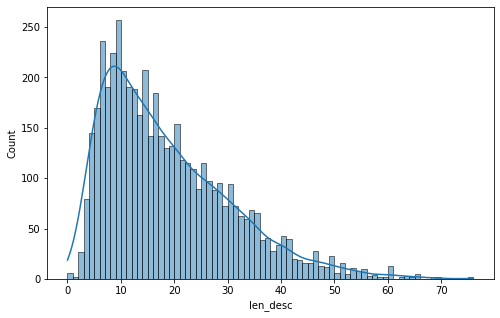

In [85]:
_, ax = plt.subplots(1,1,figsize=(8,5))
sns.histplot(data=df, x='len_desc', ax=ax, binwidth=1, kde=True)
plt.show()

    The distribution of the length of record names is very similar to the following distributions: F, Weibull, Gamma, Lognormal, p-Lognormal. It may be that I drop these values later on. At the moment these are what I am considering using as the target value for the model; however, this may change if I am able to discern any real pattern.

In [86]:
check1010 = np.random.choice(df.index.values, int(df.shape[0]/100), replace=False)

In [87]:
df[df.index.isin(check1010)]

,description,medical_specialty,transcription,pp,len_desc
2,Consult for laparoscopic gastric bypass.,Bariatrics,"HISTORY OF PRESENT ILLNESS: , I have seen ABC ...",[HISTORY OF PRESENT ILLNESS I have seen ABC t...,5
81,"A 6-mm left intrarenal stone, nonobstructing,...",Urology,"HISTORY OF PRESENT ILLNESS: , The patient pres...",[HISTORY OF PRESENT ILLNESS The patient prese...,10
116,"The patient had hematuria, and unable to void...",Urology,"REASON FOR CONSULTATION:, Hematuria and urina...",[REASON FOR CONSULTATION Hematuria and urinar...,29
124,Epididymectomy,Urology,"EPIDIDYMECTOMY,OPERATIVE NOTE: ,The patient w...",[EPIDIDYMECTOMYOPERATIVE NOTE The patient was ...,1
144,Cystoscopy and Bladder biopsy with fulguratio...,Urology,"PREOPERATIVE DIAGNOSIS:, History of bladder t...",[PREOPERATIVE DIAGNOSIS History of bladder tu...,17
463,Excision of right superior parathyroid adenom...,Surgery,"PREOPERATIVE DIAGNOSIS:, Right superior parat...",[PREOPERATIVE DIAGNOSIS Right superior parath...,14
507,Right radical nephrectomy and assisted laparo...,Surgery,"PREOPERATIVE DIAGNOSIS: , Right renal mass.,PO...","[PREOPERATIVE DIAGNOSIS Right renal mass, POS...",7
536,Endoscopic subperiosteal midface lift using t...,Surgery,"PREOPERATIVE DIAGNOSES:,1. Request for cosmet...",[PREOPERATIVE DIAGNOSES Request for cosmetic s...,26
547,Posterior mediastinal mass with possible neur...,Surgery,"PREOPERATIVE DIAGNOSIS:, Posterior mediastina...",[PREOPERATIVE DIAGNOSIS Posterior mediastinal...,23
594,"Intramuscular lipoma, right upper extremity. ...",Surgery,"PREOPERATIVE DIAGNOSIS:, Mass lesion, right u...",[PREOPERATIVE DIAGNOSIS Mass lesion right upp...,12


In [88]:
". ".join([item for item in df.iloc[1506].pp if "FINDING" in item])

''

### Observation 2:

Having seen that the naive approach of splitting data solely on the '.,' sequence doesn't quite provide the results that we are looking for. This becomes an issue in some intances where it would appear that newline characters have been replace with commas, which makes this task slightly more complicated.

### Extracting Uppercase KEY WORDS

In [89]:
def get_upper_sequences(s):
    return re.findall(r"\b[A-Z][A-Z]+\b", s)

In [90]:
df['upper_words'] = df.transcription.apply(lambda x: get_upper_sequences(x))

In [91]:
terms = df.groupby('medical_specialty')['upper_words'].sum().reset_index()

In [92]:
stop_words.extend(['xyz','abc','mr','mrs','ms','dr','xxxx','yyyy','mm','dd'])#adding a few stop words

In [93]:
terms.upper_words = terms.upper_words.apply(lambda x: [item for item in x if item.lower() not in stop_words])

In [94]:
terms

,medical_specialty,upper_words
0,Allergy / Immunology,"[SUBJECTIVE, MEDICATIONS, ALLERGIES, OBJECTIVE..."
1,Autopsy,"[SUMMARY, CLINICAL, HISTORY, EMS, EMS, EMS, EM..."
2,Bariatrics,"[PAST, MEDICAL, HISTORY, PAST, SURGICAL, HISTO..."
3,Cardiovascular / Pulmonary,"[MODE, LV, LV, PA, DOPPLER, ECHOCARDIOGRAM, DE..."
4,Chiropractic,"[PRESENT, COMPLAINTS, VAS, PHYSICAL, EXAMINATI..."
5,Consult - History and Phy.,"[SUBJECTIVE, II, II, PAST, MEDICAL, HISTORY, S..."
6,Cosmetic / Plastic Surgery,"[PREOPERATIVE, DIAGNOSES, PROCEDURE, ANESTHESI..."
7,Dentistry,"[PREOPERATIVE, DIAGNOSIS, POSTOPERATIVE, DIAGN..."
8,Dermatology,"[PROCEDURE, INDICATION, PROCEDURE, NOTE, IMPRE..."
9,Diets and Nutritions,"[SUBJECTIVE, OBJECTIVE, ASSESSMENT, PLAN, SUBJ..."


In [95]:
top10 = []
for item in terms.medical_specialty.values:
    top10.append(Counter(terms[terms.medical_specialty==item].upper_words.values[0]).most_common(10))

In [96]:
terms['top10']= top10

In [97]:
terms['top10'] = terms.top10.apply(lambda x: [item[0] for item in x])

In [98]:
terms

,medical_specialty,upper_words,top10
0,Allergy / Immunology,"[SUBJECTIVE, MEDICATIONS, ALLERGIES, OBJECTIVE...","[HISTORY, PAST, MEDICATIONS, ALLERGIES, MEDICA..."
1,Autopsy,"[SUMMARY, CLINICAL, HISTORY, EMS, EMS, EMS, EM...","[SYSTEM, EXAMINATION, BLOOD, EXTERNAL, ETS, IN..."
2,Bariatrics,"[PAST, MEDICAL, HISTORY, PAST, SURGICAL, HISTO...","[HISTORY, PAST, PHYSICAL, PROCEDURE, BMI, MEDI..."
3,Cardiovascular / Pulmonary,"[MODE, LV, LV, PA, DOPPLER, ECHOCARDIOGRAM, DE...","[PROCEDURE, HISTORY, DIAGNOSIS, IMPRESSION, LA..."
4,Chiropractic,"[PRESENT, COMPLAINTS, VAS, PHYSICAL, EXAMINATI...","[MRI, HISTORY, EXAMINATION, PRESENT, PHYSICAL,..."
5,Consult - History and Phy.,"[SUBJECTIVE, II, II, PAST, MEDICAL, HISTORY, S...","[HISTORY, PAST, PHYSICAL, EXAMINATION, MEDICAT..."
6,Cosmetic / Plastic Surgery,"[PREOPERATIVE, DIAGNOSES, PROCEDURE, ANESTHESI...","[PROCEDURE, DIAGNOSIS, PREOPERATIVE, ANESTHESI..."
7,Dentistry,"[PREOPERATIVE, DIAGNOSIS, POSTOPERATIVE, DIAGN...","[PROCEDURE, DIAGNOSIS, DIAGNOSES, PREOPERATIVE..."
8,Dermatology,"[PROCEDURE, INDICATION, PROCEDURE, NOTE, IMPRE...","[HISTORY, PROCEDURE, DIAGNOSIS, MEDICATIONS, D..."
9,Diets and Nutritions,"[SUBJECTIVE, OBJECTIVE, ASSESSMENT, PLAN, SUBJ...","[SUBJECTIVE, ASSESSMENT, OBJECTIVE, PLAN, BMI,..."


In [99]:
def get_text_sequences(s):
    pattern = r"(.*?)(?=\.\s[A-Z][A-Z]+|\Z)"
    s = re.sub(r'\.,','. ',s.replace(": ,",":,"))
    s = re.sub("XYZ", 'xyz', s)
    s = re.sub("ABC", "abc", s)
    s = re.sub("Dr.","dr", s)
    s = re.sub("YYYY","year",s)
    s = re.sub("Mr.","mr", s)
    s = re.sub("Mrs.", "mrs", s)
    #s = re.sub(r"(?<=(?<![\/\.A-Z])\d)\.",")",s)
    return [item for item in re.findall(pattern,s) if item != ""]

In [100]:
get_text_sequences(df.iloc[2345].transcription)

['PREOPERATIVE DIAGNOSES,1.  Herniated nucleus pulposus, C5-C6. 2.  Herniated nucleus pulposus, C6-C7',
 '. POSTOPERATIVE DIAGNOSES,1.  Herniated nucleus pulposus, C5-C6. 2.  Herniated nucleus pulposus, C6-C7',
 '. PROCEDURE PERFORMED,1.  Anterior cervical decompression, C5-C6. 2.  Anterior cervical decompression, C6-C7. 3.  Anterior spine instrumentation. 4.  Anterior cervical spine fusion, C5-C6. 5.  Anterior cervical spine fusion, C6-C7. 6.  Application of machined allograft at C5-C6. 7.  Application of machined allograft at C6-C7. 8.  Allograft, structural at C5-C6. 9.  Allograft, structural at C6-C7',
 '. ANESTHESIA:, General',
 '. PREOPERATIVE NOTE:  ,This patient is a 47-year-old male with chief complaint of severe neck pain and left upper extremity numbness and weakness.  Preoperative MRI scan showed evidence of herniated nucleus pulposus at C5-C6 and C6-C7 on the left.  The patient has failed epidural steroid injections.  Risks and benefits of the above procedure were discusse

In [101]:
df['pp2'] = df.transcription.apply(lambda x: get_text_sequences(x))

In [102]:
df[df.medical_specialty == terms.medical_specialty[0]].iloc[-1]

description           Acute allergic reaction, etiology uncertain, ...
medical_specialty                                 Allergy / Immunology
transcription        HISTORY: , A 34-year-old male presents today s...
pp                   [HISTORY  A 34yearold male presents today self...
len_desc                                                             9
upper_words          [HISTORY, ABC, ABC, XYZ, PAST, MEDICAL, HISTOR...
pp2                  [HISTORY:, A 34-year-old male presents today s...
Name: 4965, dtype: object

### Description length by specialty

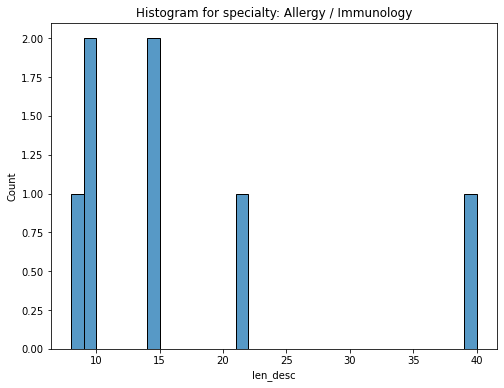

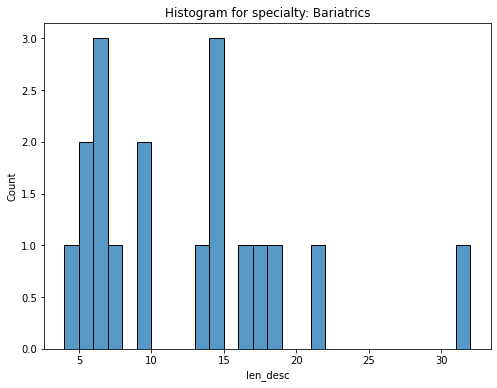

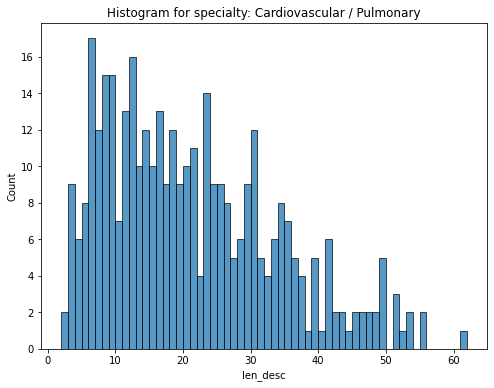

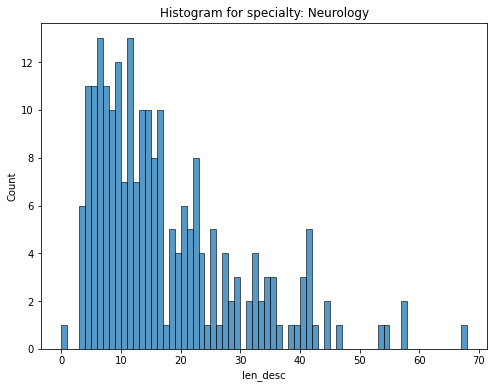

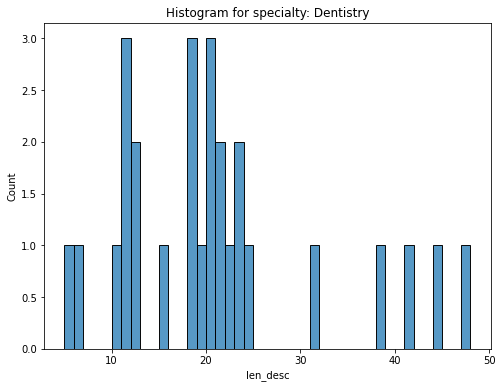

...

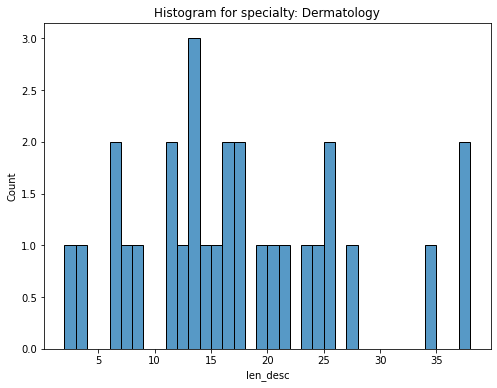

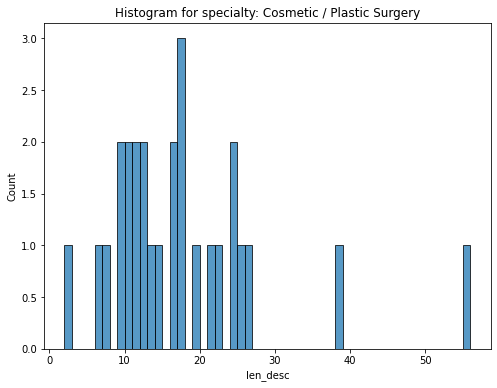

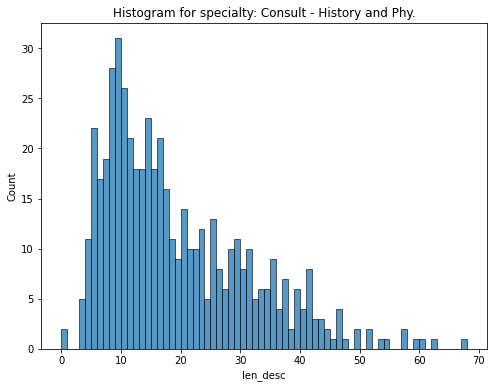

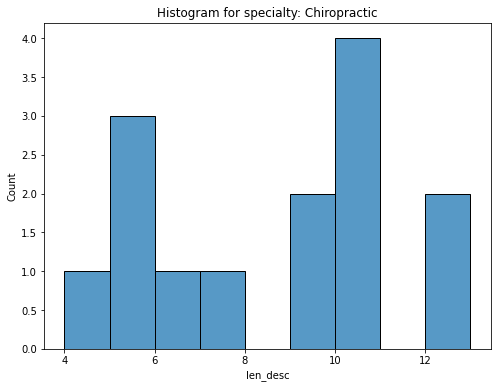

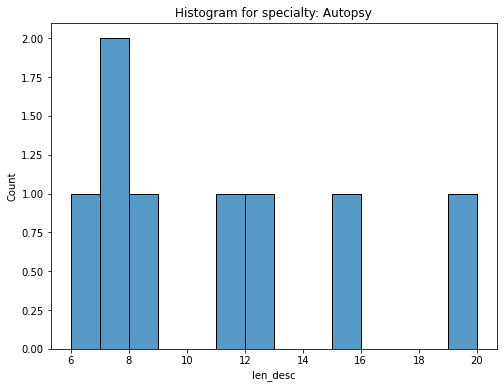

In [103]:
for item in df.medical_specialty.unique(): 
    _,ax = plt.subplots(1,1,figsize=(8,6))  
    sns.histplot(data=df[df.medical_specialty == item], x='len_desc',ax = ax, binwidth=1)
    ax.set_title(f"Histogram for specialty:{item}")
    plt.show()

In [104]:
df.shape

(4966, 7)

In [105]:
Counter(terms.upper_words.sum()).most_common(20)

[('HISTORY', 4907),
 ('PROCEDURE', 3595),
 ('DIAGNOSIS', 2701),
 ('PREOPERATIVE', 1741),
 ('POSTOPERATIVE', 1718),
 ('DIAGNOSES', 1561),
 ('PAST', 1369),
 ('IV', 1321),
 ('ANESTHESIA', 1321),
 ('MEDICATIONS', 1250),
 ('PHYSICAL', 1213),
 ('EXAMINATION', 1146),
 ('PLAN', 1118),
 ('CT', 1102),
 ('IMPRESSION', 1089),
 ('FINDINGS', 1028),
 ('PRESENT', 1022),
 ('MEDICAL', 1015),
 ('ILLNESS', 999),
 ('ALLERGIES', 986)]

In [106]:
df.iloc[4105].pp2

['CHIEF COMPLAINT:,  This 26 year old male presents today for treatment of suspected rheumatoid arthritis.  Associated signs and symptoms include aching, joint pain, and symmetrical joint swelling bilateral.  Patient denies any previous history, related trauma or previous treatments for this condition.  Condition has existed for 2 weeks.  He indicates the problem location is the right hand and left hand.  Patient indicates no modifying factors.  Severity of condition is slowly worsening.  Onset was unknown',
 '. ALLERGIES:,  Patient admits allergies to aspirin resulting in GI upset, disorientation',
 '. MEDICATION HISTORY:, Patient is currently taking amoxicillin-clavulanate 125 mg-31.25 mg tablet, chewable medication was prescribed by A. General Practitioner MD, Adrenocot 0.5 mg tablet medication was prescribed by A. General Practitioner MD',
 '. PAST MEDICAL HISTORY:,  Past medical history is unremarkable',
 '. PAST SURGICAL HISTORY:, Patient admits past surgical history of (+) appen

Extract records that have the information we are looking for.

In [249]:
tmp1 = df[(df.transcription.str.contains('IMPRESSION')) & (df.transcription.str.contains('FINDING'))].copy()

Extract records that have the IMPRESSION section i.e. the target summary we are looking for, but not the FINDINGS section. In this case we shall be using another common keyword to extract similar information.

In [279]:
tmp2 = df[(df.transcription.str.contains('IMPRESSION')) & ~(df.transcription.str.contains('FINDING'))].copy()

Extract records that have the information that we shall be performing the summary on, but missing the target information of our summary. As with the above set we shall be using some other to be determined keyword value in place of IMPRESSION to act as the target. It will likely be the case that we use description of the transcription itself as the target.

In [252]:
tmp3 = df[~(df.transcription.str.contains('IMPRESSION')) & (df.transcription.str.contains('FINDING'))].copy()

In [253]:
tmp4 = df[(df.transcription.str.contains('IMPRESSION')) & (df.transcription.str.contains('INDICATION'))].copy()

In [254]:
tmp4.shape

(107, 7)

In [255]:
input_terms = ["FINDING","INDICATION"]
target_terms = ["IMPRESSION"]

#### Good measures:

Before we dive in to tackling the extraction of the text we are interested in, I am first going to make sure that there are no index rows in all of the DataFrames

In [256]:
len(set.intersection(set(tmp1.index),set(tmp2.index)))

0

In [257]:
len(set.intersection(set(tmp1.index), set(tmp3.index)))

0

In [258]:
len(set.intersection(set(tmp1.index), set(tmp4.index)))

54

In [259]:
len(set.intersection(set(tmp2.index),set(tmp3.index)))

0

In [260]:
len(set.intersection(set(tmp2.index),set(tmp4.index)))

53

In [261]:
len(set.intersection(set(tmp3.index),set(tmp4.index)))

0

In [262]:
set.intersection(set.intersection(set(tmp1.index), set(tmp4.index)),set.intersection(set(tmp2.index),set(tmp4.index)))

set()

The above set intersections tell me that the temporary frames 1-3 account for the import cases of information. Temporary frame 4 which only contains 107 records (not all of which are unique) is entirely accounted for by sets 1 and 2 so I will be ignoring this one altogether.



In [263]:
def create_sum_text(s, checker):
    
    filtered_text = [re.sub("\s\s", " ", re.sub(r"\A\.\s\b","" ,re.sub(":,",":",item))) for item in s if any(word in item for word in checker)]
    if filtered_text:
        return ". ".join(filtered_text)
    else:
        return ""


In [264]:
tmp1['target'] = tmp1.pp2.apply(lambda x: create_sum_text(x, target_terms))
tmp1['input'] = tmp1.pp2.apply(lambda x: create_sum_text(x, input_terms))

In [265]:
tmp1[(tmp1.input.str.len() < tmp1.target.str.len())]

,description,medical_specialty,transcription,pp,len_desc,upper_words,pp2,target,input
122,Recurring bladder infections with frequency a...,Urology,"PREOPERATIVE DIAGNOSIS:, Recurring bladder in...",[PREOPERATIVE DIAGNOSIS Recurring bladder inf...,18,"[PREOPERATIVE, DIAGNOSIS, LA, POSTOPERATIVE, D...","[PREOPERATIVE DIAGNOSIS:, Recurring bladder i...",IMPRESSION: Atrophic vaginitis with overactive...,FINDINGS: Atrophic vaginitis
780,Recurring bladder infections with frequency a...,Surgery,"PREOPERATIVE DIAGNOSIS:, Recurring bladder in...",[PREOPERATIVE DIAGNOSIS Recurring bladder inf...,18,"[PREOPERATIVE, DIAGNOSIS, LA, POSTOPERATIVE, D...","[PREOPERATIVE DIAGNOSIS:, Recurring bladder i...",IMPRESSION: Atrophic vaginitis with overactive...,FINDINGS: Atrophic vaginitis
1089,"Left Cardiac Catheterization, Left Ventriculo...",Surgery,"PROCEDURE:, Left Cardiac Catheterization, Lef...",[PROCEDURE Left Cardiac Catheterization Left ...,10,"[PROCEDURE, INDICATIONS, PATIENT, HISTORY, PAS...","[PROCEDURE:, Left Cardiac Catheterization, Le...",COMPLICATIONS:There were no complications duri...,INDICATIONS: Atherosclerotic coronary artery d...
1090,Patient with significant angina with moderate...,Surgery,The patient and his wife had the opportunity t...,[The patient and his wife had the opportunity ...,21,"[PROCEDURE, NOTE, CDRC, FINDINGS, HEMODYNAMICS...",[The patient and his wife had the opportunity ...,IMPRESSION:1. Mild to moderate left main steno...,"FINDINGS:HEMODYNAMICS: LV pressure is 120, EDP..."
1565,MRI report Cervical Spine (Chiropractic Speci...,Radiology,"FINDINGS:,Normal foramen magnum.,Normal brains...","[FINDINGS Normal foramen magnum, Normal brains...",6,"[FINDINGS, AP, CSF, AP, AP, AP, CSF, AP, CSF, ...","[FINDINGS:,Normal foramen magnum. Normal brain...",IMPRESSION:Multilevel degenerative disc diseas...,FINDINGS:Normal foramen magnum. Normal brainst...
1570,MRI cervical spine.,Radiology,"EXAM:,MRI CERVICAL SPINE,CLINICAL:, A57-year-o...",[EXAM MRI CERVICAL SPINECLINICAL A57yearold m...,3,"[EXAM, MRI, CERVICAL, SPINE, CLINICAL, MRI, FI...","[EXAM:,MRI CERVICAL SPINE,CLINICAL:, A57-year-...",IMPRESSION:Multilevel degenerative disc diseas...,FINDINGS:Normal brainstem-cervical cord juncti...
1575,Bilateral breast MRI with & without IV contrast.,Radiology,"FINDINGS:,There are post biopsy changes seen i...",[FINDINGS There are post biopsy changes seen i...,8,"[FINDINGS, MRI, IMPRESSION, BIRADS, CATEGORY, ...","[FINDINGS:,There are post biopsy changes seen ...","IMPRESSION: BIRADS CATEGORY M/5,There is a mal...",FINDINGS:There are post biopsy changes seen in...
1666,This is a middle-aged female with low back pa...,Radiology,"FINDINGS:,High resolution computerized tomogra...",[FINDINGS High resolution computerized tomogra...,22,"[FINDINGS, COMPARISON, MRI, AP, IMPRESSION]","[FINDINGS:,High resolution computerized tomogr...",IMPRESSION:Minimal curvature of the lumbar spi...,FINDINGS:High resolution computerized tomograp...
1701,A 62-year-old male with a history of ischemic...,Radiology,"COMPARISON STUDIES:, None.,MEDICATION: , Lopr...","[COMPARISON STUDIES None, MEDICATION Lopress...",12,"[COMPARISON, STUDIES, MEDICATION, IV, HEART, R...","[COMPARISON STUDIES:, None, . MEDICATION:, Lo...",IMPRESSION:Limited examination secondary to ex...,FINDINGS:LEFT MAIN CORONARY ARTERY:The left ma...
1703,CCTA with Cardiac Function/Calcium Scoring,Radiology,"CARDIAC CT INCLUDING CORONARY CT ANGIOGRAPHY,P...",[CARDIAC CT INCLUDING CORONARY CT ANGIOGRAPHYP...,5,"[CARDIAC, CT, INCLUDING, CORONARY, CT, ANGIOGR...","[CARDIAC CT INCLUDING CORONARY CT ANGIOGRAPHY,...",FINAL IMPRESSION:1. Mild coronary artery disea...,ANCILLARY FINDINGS: None


The above frame suggests that we have extracted pertinent information from the frame slice; however there are some instances where the combined findings/indication sections are shorter that the impression. This is not good, we will either try to add another element to these.

In [266]:
tmp1_short_uniques = []
for item in tmp1[(tmp1.input.str.len() < tmp1.target.str.len())].upper_words.values:
    tmp1_short_uniques.extend(list(set(item)))

Counter(tmp1_short_uniques).most_common(20)


[('FINDINGS', 35),
 ('IMPRESSION', 35),
 ('HISTORY', 13),
 ('CORONARY', 10),
 ('AP', 10),
 ('MRI', 10),
 ('FOR', 9),
 ('PROCEDURE', 8),
 ('RIGHT', 8),
 ('ARTERY', 8),
 ('MAIN', 8),
 ('DESCENDING', 8),
 ('CIRCUMFLEX', 8),
 ('IV', 8),
 ('MEDICATIONS', 8),
 ('LEFT', 8),
 ('ANTERIOR', 8),
 ('CSF', 7),
 ('EXAM', 7),
 ('COMPARISON', 7)]

FINDING, EXAM, PROCEDURE, HISTORY, COMPARISON

These terms will make up the extended keyword search from the above list of the top 20 most common unique terms from each transcription.

Before extending the short inputs with these sections there are:


In [267]:
tmp1[(tmp1.input.str.len() < tmp1.target.str.len())].shape

(35, 9)

In [268]:
tmp1['input'] = np.where((tmp1.input.str.len() < tmp1.target.str.len()),tmp1.pp2.apply(lambda x: create_sum_text(x,["FINDING","EXAM","PROCEDURE","HISTORY"])),tmp1.input)

Afterwards there are:

In [269]:
tmp1[(tmp1.input.str.len() < tmp1.target.str.len())].shape

(11, 9)

The remainder of short input sequences will be dropped from the DataFrame



In [270]:
tmp1 = tmp1[~(tmp1.input.str.len() < tmp1.target.str.len())].copy()

Now to look at the records missing the keywords for the input data.

In [280]:
tmp2['target'] = tmp2.pp2.apply(lambda x: create_sum_text(x, target_terms))
tmp2['input'] = tmp2.pp2.apply(lambda x: create_sum_text(x, input_terms))

In [281]:
tmp2[(tmp2.input.str.len() < tmp2.target.str.len())].shape

(729, 9)

In [282]:
tmp2_uniques = []
for item in tmp2[(tmp2.input.str.len() < tmp2.target.str.len())].upper_words.values:
    tmp2_uniques.extend(list(set(item)))

Counter(tmp2_uniques).most_common(70)

[('IMPRESSION', 723),
 ('HISTORY', 523),
 ('OF', 449),
 ('PHYSICAL', 445),
 ('EXAMINATION', 417),
 ('PAST', 372),
 ('MEDICATIONS', 372),
 ('PLAN', 366),
 ('MEDICAL', 356),
 ('REVIEW', 345),
 ('SYSTEMS', 337),
 ('SOCIAL', 336),
 ('ALLERGIES', 332),
 ('PRESENT', 325),
 ('ILLNESS', 323),
 ('FAMILY', 321),
 ('HEENT', 282),
 ('ABDOMEN', 241),
 ('SIGNS', 222),
 ('VITAL', 219),
 ('GENERAL', 218),
 ('EXTREMITIES', 203),
 ('FOR', 195),
 ('NECK', 192),
 ('REASON', 182),
 ('SURGICAL', 170),
 ('AND', 169),
 ('CHIEF', 168),
 ('COMPLAINT', 164),
 ('DATA', 163),
 ('LUNGS', 152),
 ('LABORATORY', 149),
 ('IV', 137),
 ('EXAM', 132),
 ('BUN', 127),
 ('HEART', 126),
 ('CURRENT', 119),
 ('MRI', 111),
 ('RECOMMENDATIONS', 106),
 ('NEUROLOGIC', 105),
 ('CARDIOVASCULAR', 104),
 ('CT', 103),
 ('EKG', 103),
 ('CHEST', 91),
 ('II', 88),
 ('PROCEDURE', 88),
 ('DIAGNOSTIC', 85),
 ('SKIN', 75),
 ('CONSULTATION', 75),
 ('INR', 73),
 ('GI', 72),
 ('XYZ', 69),
 ('ABC', 67),
 ('STUDIES', 61),
 ('DIAGNOSIS', 58),
 ('CVA

In [283]:
tmp2_checker = ["EXAM","HEENT","REVIEW",'FINDING',"INDICATION","RECOMMENDATION","PROCEDURE","DIAGNO"]

In [284]:
tmp2['input'] = np.where((tmp2.input.str.len() < tmp2.target.str.len()),tmp2.pp2.apply(lambda x: create_sum_text(x,tmp2_checker)),tmp2.input)

In [285]:
tmp2[(tmp2.input.str.len() < tmp2.target.str.len())].shape

(265, 9)

In [286]:
tmp2 = tmp2[~(tmp2.input.str.len() < tmp2.target.str.len())].copy()

In [291]:
tmp3['target'] = tmp3.description
tmp3['input'] = tmp3.pp2.apply(lambda x: create_sum_text(x, input_terms))

In [292]:
tmp3[(tmp3.input.str.len() < tmp3.target.str.len())].shape

(86, 9)

In [296]:
tmp3_uniques = []
for item in tmp3[(tmp3.input.str.len() < tmp3.target.str.len())].upper_words.values:
    tmp3_uniques.extend(list(set(item)))

Counter(tmp3_uniques).most_common(100)

[('FINDINGS', 84),
 ('PREOPERATIVE', 77),
 ('POSTOPERATIVE', 75),
 ('PROCEDURE', 69),
 ('ANESTHESIA', 64),
 ('PERFORMED', 57),
 ('DIAGNOSIS', 53),
 ('COMPLICATIONS', 47),
 ('LOSS', 47),
 ('BLOOD', 47),
 ('HISTORY', 46),
 ('ESTIMATED', 38),
 ('OF', 36),
 ('DIAGNOSES', 34),
 ('DISPOSITION', 26),
 ('PRESENT', 21),
 ('GROSS', 21),
 ('ILLNESS', 21),
 ('IV', 19),
 ('SPECIMEN', 18),
 ('BRIEF', 17),
 ('ABCD', 16),
 ('INTRAOPERATIVE', 15),
 ('PROCEDURES', 14),
 ('OPERATIVE', 13),
 ('TIME', 13),
 ('TOURNIQUET', 13),
 ('DESCRIPTION', 12),
 ('DETAIL', 11),
 ('TOTAL', 11),
 ('OPERATION', 9),
 ('PACU', 9),
 ('SUMMARY', 8),
 ('CONDITION', 8),
 ('SIGNS', 7),
 ('VITAL', 7),
 ('ASSESSMENT', 7),
 ('IN', 6),
 ('DRAINS', 6),
 ('REMOVED', 6),
 ('ACL', 6),
 ('MEDICATIONS', 6),
 ('MEDICAL', 6),
 ('CT', 5),
 ('SPECIMENS', 5),
 ('THE', 5),
 ('FOR', 5),
 ('INR', 5),
 ('MRI', 5),
 ('MAJOR', 5),
 ('VISIT', 5),
 ('CSF', 5),
 ('REASON', 5),
 ('PLAN', 5),
 ('FLUIDS', 4),
 ('IM', 4),
 ('PCL', 4),
 ('PT', 4),
 ('II', 4

In [297]:
tmp3_checker = ['FINDING',"INDICATION","PERFORMED","POSTOPERATIVE"]

In [298]:
tmp3['input'] = np.where((tmp3.input.str.len() < tmp3.target.str.len()),tmp3.pp2.apply(lambda x: create_sum_text(x,tmp3_checker)),tmp3.input)

In [299]:
tmp3[(tmp3.input.str.len() < tmp3.target.str.len())].shape

(22, 9)

In [300]:
tmp3 = tmp3[~(tmp3.input.str.len() < tmp3.target.str.len())].copy()

In [340]:
df2 = pd.concat([tmp1,tmp2,tmp3],axis=0)

In [341]:
df2.drop_duplicates(subset=['input','target'],keep='first',inplace=True)

In [342]:
df2['target'] = np.where(df2.target == '', df2.description, df2.target)

In [343]:
json_frame = df2[['input','target']].copy()

In [344]:
def remove_section_headers(frame):
    pattern = r"(?<=:)(.*?)(?=\.\s[A-Z][A-Z]+|.,[A-Z][A-Z]+:|\Z)"
    return ".".join([ item.strip().rstrip().replace(r'\s\s',' ') for item in re.findall(pattern, frame)])

In [345]:
json_frame.target = np.where(json_frame.target.apply(lambda x: remove_section_headers(x)) == '', json_frame.target, json_frame.target.apply(lambda x: remove_section_headers(x)))
json_frame.input = np.where(json_frame.input.apply(lambda x: remove_section_headers(x)) == '', json_frame.input, json_frame.input.apply(lambda x: remove_section_headers(x)))

In [346]:
json_frame[json_frame.input == '']

,input,target


In [338]:
json_frame[json_frame.target == '']

,input,target


In [347]:
json_frame.to_json(datapath/"preprocessed2.jsonl",orient='records',lines=True)

## Result
We started off with ~5k records and parsed this down to close to 700 records. The content of these records should be more consistent with the data that was used to train the ClinicalBioBertSum model for abstractive and extractive summarization. 

We have now prepared a small subset of data with which we will use to fine-tune a model to summarize records of this type.

# EDA

To explore this data set 

In [356]:
from wordcloud import wordcloud
from textblob import TextBlob
from nltk.probability import FreqDist

from gensim.utils import simple_preprocess

In [349]:
sent_inv = df2.groupby('medical_specialty')[['input','target']].sum()

In [350]:
sent_inv.head()

,input,target
medical_specialty,,
Bariatrics,"REVIEW OF SYSTEMS: Negative for head, neck, he...",IMPRESSION/PLAN: I have explained to him the r...
Cardiovascular / Pulmonary,FINDINGS: The patient was exercised according ...,IMPRESSION:1. Good exercise tolerance. 2. Adeq...
Consult - History and Phy.,"PHYSICAL FINDINGS,VITAL SIGNS: Presenting bloo...","IMPRESSION,1. Acute pulmonary edema. 2. Physic..."
Cosmetic / Plastic Surgery,HISTORY OF PRESENT ILLNESS: The patient is a v...,IMPRESSION AND PLAN: Hypomastia. I think her g...
Dermatology,PHYSICAL EXAMINATION: The patient is well deve...,"IMPRESSION: Hyperesthesia, question etiologyIM..."


In [357]:
def split_remove_join(s):
    tokens = [word for word in simple_preprocess(s) if word not in stop_words]
    return tokens

In [352]:
stop_words.append("patient")

In [358]:
sent_inv['in_counts'] = sent_inv.input.apply(lambda x: FreqDist(split_remove_join(x)).most_common(100))
sent_inv['tg_counts'] = sent_inv.target.apply(lambda x: FreqDist(split_remove_join(x)).most_common(100))

In [359]:
sent_inv.reset_index(inplace=True)

In [360]:
sent_inv.head()

,medical_specialty,input,target,in_counts,tg_counts
0,Bariatrics,"REVIEW OF SYSTEMS: Negative for head, neck, he...",IMPRESSION/PLAN: I have explained to him the r...,"[(cc, 6), (denies, 5), (heart, 4), (abdomen, 4...","[(need, 6), (potential, 2), (complications, 2)..."
1,Cardiovascular / Pulmonary,FINDINGS: The patient was exercised according ...,IMPRESSION:1. Good exercise tolerance. 2. Adeq...,"[(capacity, 8), (volume, 6), (heart, 5), (rate...","[(capacity, 6), (disease, 5), (volume, 5), (lu..."
2,Consult - History and Phy.,"PHYSICAL FINDINGS,VITAL SIGNS: Presenting bloo...","IMPRESSION,1. Acute pulmonary edema. 2. Physic...","[(normal, 38), (examination, 32), (systems, 26...","[(old, 13), (atrial, 12), (year, 11), (history..."
3,Cosmetic / Plastic Surgery,HISTORY OF PRESENT ILLNESS: The patient is a v...,IMPRESSION AND PLAN: Hypomastia. I think her g...,"[(history, 5), (surgery, 4), (currently, 4), (...","[(think, 5), (would, 3), (skin, 3), (general, ..."
4,Dermatology,PHYSICAL EXAMINATION: The patient is well deve...,"IMPRESSION: Hyperesthesia, question etiologyIM...","[(normal, 10), (well, 8), (levels, 6), (skin, ...","[(impression, 1), (hyperesthesia, 1), (questio..."


## Visualizing 100 most frequent words
### Input by specialty

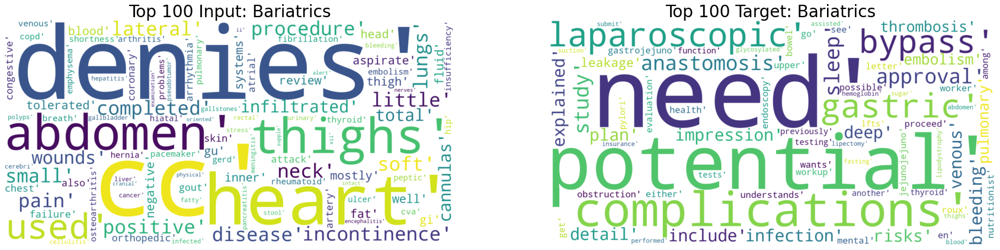

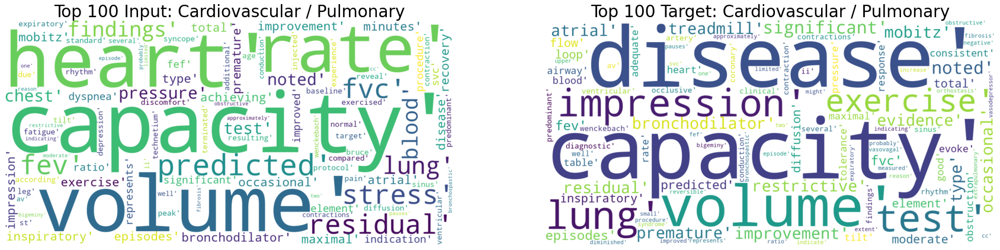

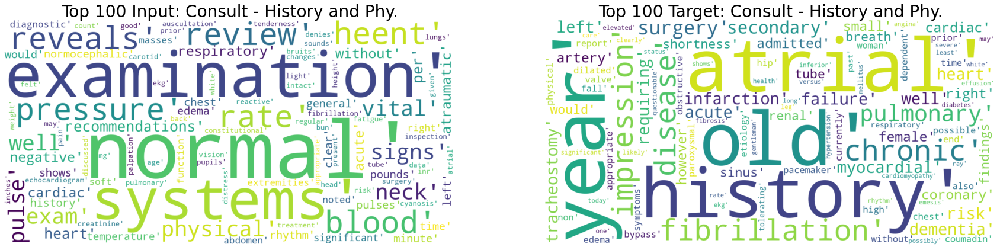

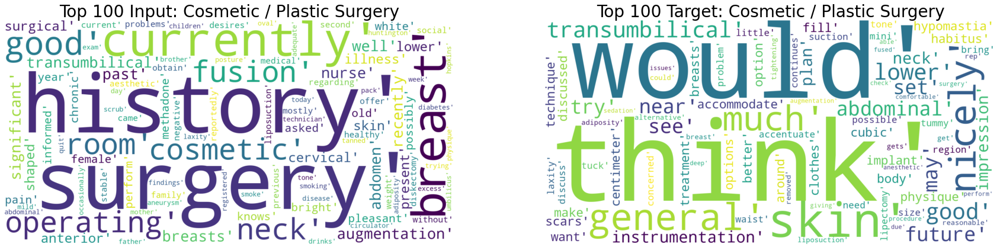

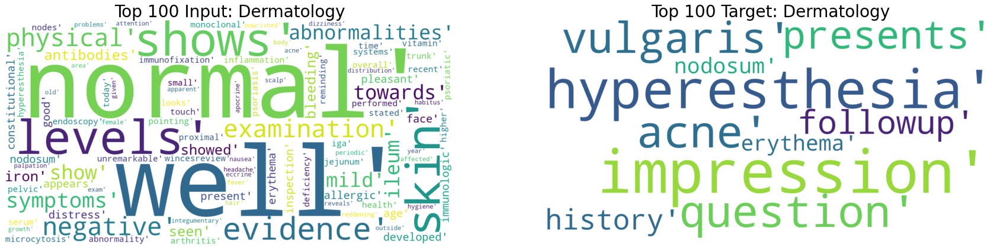

...

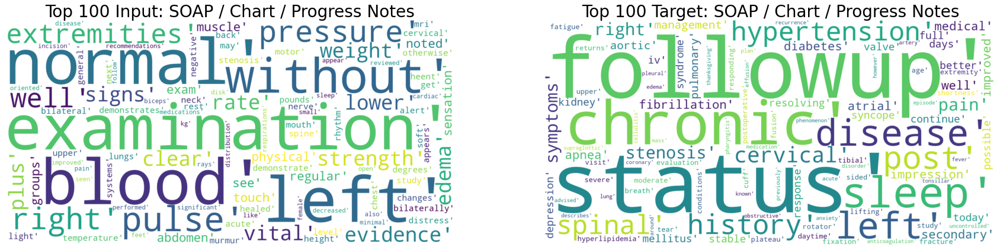

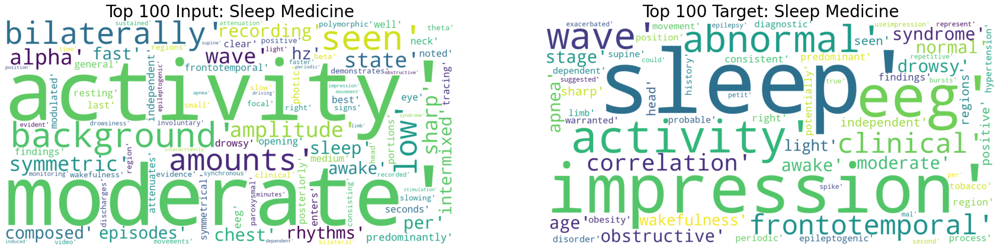

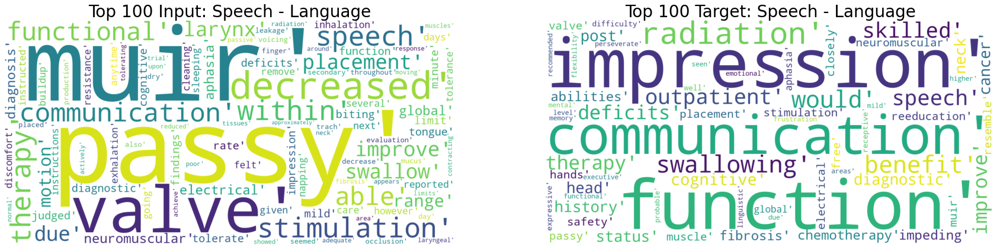

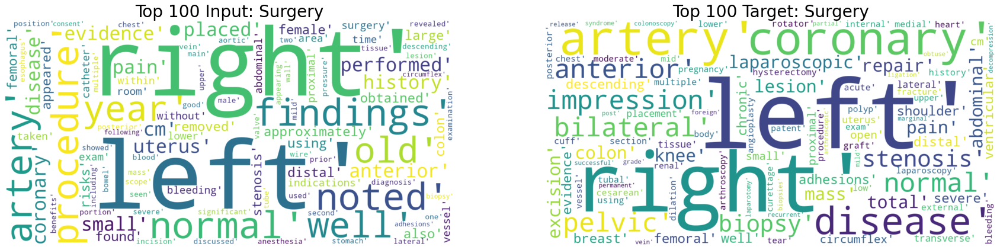

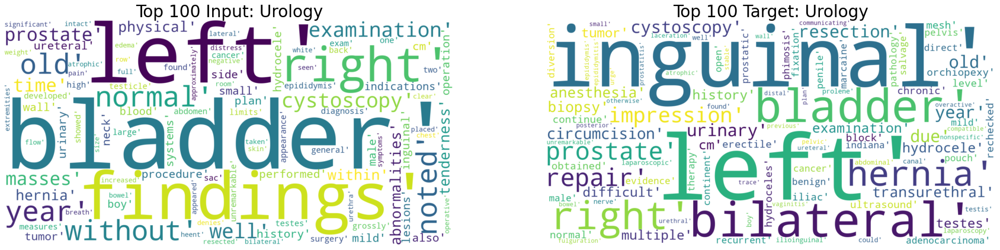

In [361]:
for item in sent_inv.index.tolist():
    data = sent_inv.iloc[item]
    wrdcld_in = wordcloud.WordCloud(width=1600, height= 800, background_color='white')\
    .generate(str(data.in_counts))
    wrdcld_tg = wordcloud.WordCloud(width=1600, height= 800, background_color='white')\
    .generate(str(data.tg_counts))
    print('')
    _, [ax1,ax2] = plt.subplots(1,2,figsize=(30,10))
    ax1.imshow(wrdcld_in, interpolation='bilinear')
    ax2.imshow(wrdcld_tg, interpolation='bilinear')
    ax1.axis('off')
    ax2.axis("off")
    ax1.set_title(f'Top 100 Input:{data.medical_specialty}', fontsize=28)
    ax2.set_title(f'Top 100 Target:{data.medical_specialty}', fontsize=28)

    plt.show()

There are very appropriate terms used in each of the above categories. Some noteable patterns are the emphasis on pain, age, and differentiation between which side of the body something is occurring on. It is interesting that the term cervical appears under the neurology heading. From a previous investigation I am aware of one (possibly duplicated) record of a patient that came in showing neurological impairment only to later be diagnosed with stage -iv cervical cancer :(.

It is curious the difference in frequency of the words "right" and "left" compared to every other term for orthopedics. This makes sense since those records are primarily concerned with the diagnosis and repair of injury associated to many different components of joints. i.e. initial diagnosis might be left mcl rupture, and the might tack on left ACL, Left Miniscus, Left FMC, etc. 

Furthermore, we see that from having removed duplicate entries and futher preprocessing of the data there are several disciplines that seem to have very few documents left.


## visualizing sequence lengths:

The prospective model for transfer learning has a maximum input size of 128 tokens. Therefore the next step in analyzing data is to see which categories are likely to see the greatest loss of information due to truncation of sequences.

In [380]:
df2["tgt_len"] = df2.target.apply(lambda x: sum([len(simple_preprocess(item)) for item in list(x.split('.'))]))

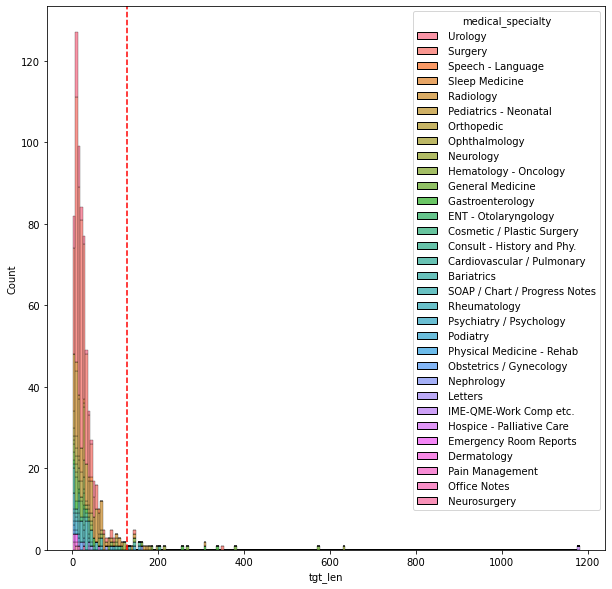

In [382]:
_, ax = plt.subplots(1,1,figsize=(10,10))
sns.histplot(data=df2, x='tgt_len',ax=ax, hue='medical_specialty', multiple='stack')
ax.axvline(128, color='r', linestyle='--')
#plt.legend(loc="upper left", bbox_to_anchor=(1.0,1.0))
plt.show()

We are going to be restricting the summaries generated by our model to 128 tokens. From the above figure we can see that the majority of our target 'summaries' are well below this number.

In [383]:
ans = df2[df2['tgt_len']>128].shape[0]/df2.shape[0]
print(f'The percent of squences with more than 128 words in the remainder of the data set is: {ans:.2%}')

The percent of squences with more than 128 words in the remainder of the data set is: 4.04%


In [384]:
df2["inp_len"] = df2.input.apply(lambda x: sum([len(simple_preprocess(item)) for item in list(x.split('.'))]))

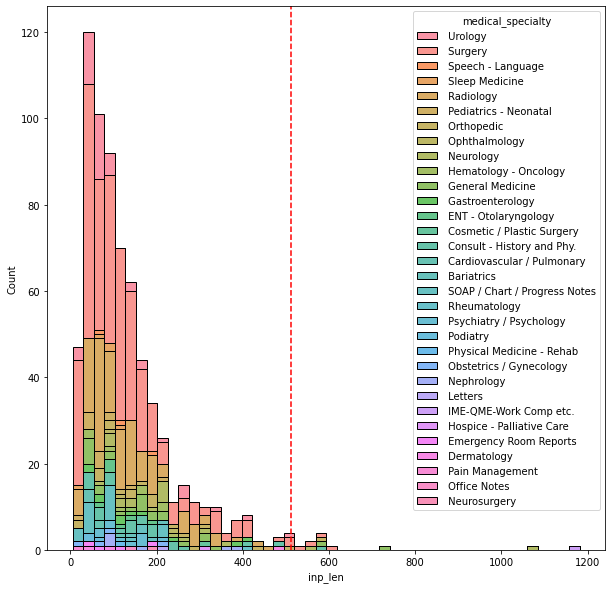

In [386]:
_, ax = plt.subplots(1,1,figsize=(10,10))
sns.histplot(data=df2, x='inp_len',ax=ax, hue='medical_specialty', multiple='stack')
ax.axvline(512, color='r', linestyle='--')
#plt.legend(loc="upper left", bbox_to_anchor=(1.0,1.0))
plt.show()

In [388]:
ans = df2[df2['inp_len']>512].shape[0]/df2.shape[0]
print(f'The percent of squences with more than 512 words in the remainder of the data set is: {ans:.2%}')

The percent of squences with more than 512 words in the remainder of the data set is: 2.02%
